<a href="https://colab.research.google.com/gist/vinotharjun/2bd29fd5de9eebbed39f9c041f6c6b53/similar-image-clustering-research.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%matplotlib inline
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import json 
import pickle
from PIL import Image
from sklearn.manifold import TSNE
import pickle
import os 
import json
import random 
# !ls

In [0]:
import keras
from keras.preprocessing import image
from keras.applications.imagenet_utils import decode_predictions, preprocess_input
from keras.models import Model
# from thilak.ai import *



In [0]:
# #loading the data
# !wget https://goo.gl/Lf9vmN -O images.tar.gz
# !tar -zxf images.tar.gz

/content/images


## Pretrained model 

In [0]:
model=keras.applications.VGG16(weights="imagenet",include_top=True)
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [0]:
#loadimage
def load_image(path):
  img=image.load_img(path,target_size=model.input_shape[1:3])
  x=image.img_to_array(img)
  x=np.expand_dims(x,axis=0)
#   print(x)
  x=preprocess_input(x)
#   print(x)
  return img,x

In [0]:
!ls

sample_data



## Sample image display

(1, 224, 224, 3)

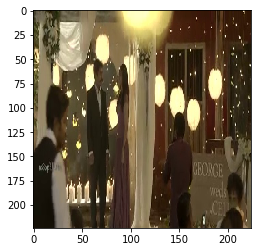

In [0]:
img,x=load_image("frame2611.jpg")
plt.imshow(img)
x.shape

## Defining the feature extractor

In [0]:
feat_extractor=Model(inputs=model.input,output=model.get_layer("fc2").output)
feat_extractor.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("fc...)`
  """Entry point for launching an IPython kernel.


In [0]:
features=[]
# import time
import glob
count=0
for i in glob.glob("*.jpg"):
#   print(i)
  img, x = load_image(i);
  feat = feat_extractor.predict(x)[0]
  features.append(feat)
  print(count)
  count=count+1
  

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [0]:
len(features)

3001

## Reduce the dimention of the extracted feature

In [0]:
from sklearn.decomposition import PCA

features = np.array(features)
pca = PCA(n_components=300)
pca.fit(features)

PCA(copy=True, iterated_power='auto', n_components=300, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [0]:
pca_features=pca.transform(features)

In [0]:
pca_features[0].shape

(300,)

In [0]:

num_images_to_plot = 1000

In [0]:
images=[]
for i in glob.glob("*.jpg"):
  images.append(i)
len(images)
len(pca_features)

3001

In [0]:
sort_order = sorted(random.sample(range(len(images)), num_images_to_plot))
images=[images[i] for i in sort_order]
pca_features=[pca_features[i] for i in sort_order]


In [0]:
#tsne
X=np.array(pca_features)
tsne=TSNE(n_components=2,learning_rate=150,perplexity=30,angle=0.2,verbose=2)

In [0]:
tsne=tsne.fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.012s...
[t-SNE] Computed neighbors for 1000 samples in 0.618s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 17.981854
[t-SNE] Computed conditional probabilities in 0.063s
[t-SNE] Iteration 50: error = 64.2398148, gradient norm = 0.2114033 (50 iterations in 0.884s)
[t-SNE] Iteration 100: error = 57.1561852, gradient norm = 0.0597569 (50 iterations in 0.445s)
[t-SNE] Iteration 150: error = 56.1679726, gradient norm = 0.0525090 (50 iterations in 0.399s)
[t-SNE] Iteration 200: error = 55.7593307, gradient norm = 0.0384649 (50 iterations in 0.392s)
[t-SNE] Iteration 250: error = 55.5594673, gradient norm = 0.0370360 (50 iterations in 0.376s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.559467
[t-SNE] Iteration 300: error = 0.4061162, gradient norm = 0.0008776 (50 iterations in 0.453s)
[t-SNE] Iteration 350: error = 0.2918620, gradient norm = 0.0003

In [0]:
tx,ty=tsne[:,0],tsne[:,1]

In [0]:
tx=(tx-np.min(tx))/(np.max(tx)-np.min(tx))
ty=(ty-np.min(ty))/(np.max(tx)-np.min(ty))

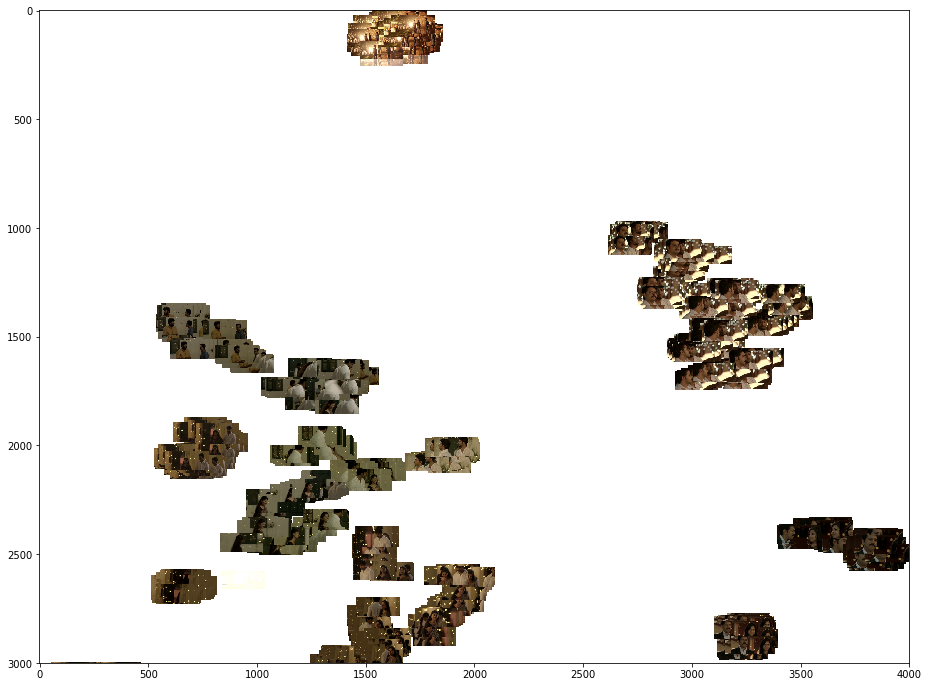

In [0]:

width = 4000
height = 3000
max_dim = 200

full_image = Image.new('RGBA', (width, height))
# print(full_image)
for img, x, y in zip(images, tx, ty):
  
    tile = Image.open(img)
    rs = max(1, tile.width/max_dim, tile.height/max_dim)
    tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim)*x), int((height-max_dim)*y)), mask=tile.convert('RGBA'))
#     full_image=tile

plt.figure(figsize = (16,12))
plt.imshow(full_image)


## Clustering the images wih features

In [0]:
from sklearn.cluster import KMeans



In [0]:
cluster_model=KMeans(n_clusters=50)
cluster_model.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=50, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [0]:
lab=cluster_model.labels_

In [0]:
centers = cluster_model.cluster_centers_
centers[0]

array([ 2.84150410e+01, -2.43252659e+00,  6.84606838e+00, -1.12964220e+01,
        2.96755743e+00, -1.21598186e+01,  1.97518120e+01,  6.76828194e+00,
        6.99905777e+00,  2.40567541e+00,  9.99846280e-01, -5.67570543e+00,
        1.17427387e+01,  3.83685398e+00,  1.21429861e+00, -9.47163010e+00,
       -1.01256981e+01,  3.31635118e+00,  4.77189350e+00,  3.73257613e+00,
        1.94937718e+00,  3.18535507e-01, -4.31883514e-01, -3.69485283e+00,
        3.23734426e+00,  1.72018874e+00,  3.70493650e+00, -6.09457612e-01,
       -1.11808157e+00, -3.89034867e+00, -2.34091258e+00, -2.40129495e+00,
       -2.48782516e+00,  3.97112370e+00, -1.02563524e+00, -1.75568509e+00,
       -1.92938283e-01,  1.21938062e+00, -1.06377828e+00, -2.61925936e+00,
       -1.17830229e+00,  1.13276482e+00, -4.26836789e-01, -7.76249290e-01,
        2.26333165e+00, -8.19217920e-01,  5.93607187e-01, -1.04253411e+00,
       -2.45534733e-01,  8.03891659e-01, -1.74530125e+00, -4.94604483e-02,
        1.61500883e+00,  

In [0]:
print(X[0].shape)
print(centers[0].shape)
        

(300,)
(300,)


## 48th cluster results

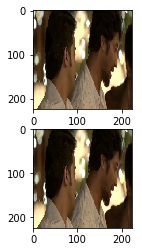

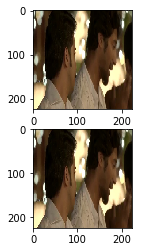

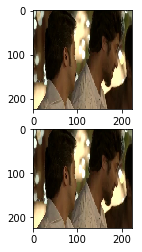

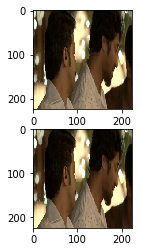

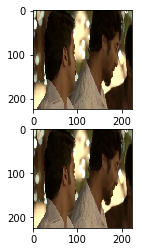

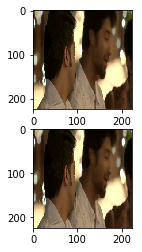

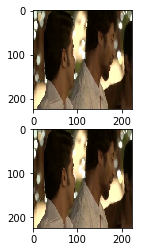

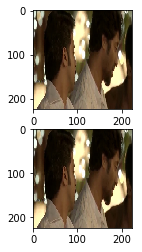

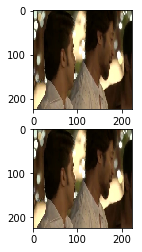

In [0]:

j=48
getlab=np.where(lab==j)[0]
img1=[]
for i in range(len(getlab)):
  x,_=load_image(images[getlab[i]])
  img1.append(x)  


plt.figure(1)
for i in range(len(img1)):
  
  plt.subplot(211)
  plt.imshow(img1[i])

  plt.subplot(212)
  plt.imshow(img1[i])
  plt.show()

## All clusterd images results

####################################   CLUSTER ###################################################################


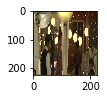

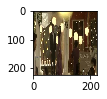

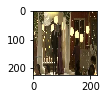

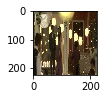

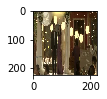

...

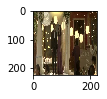

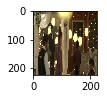

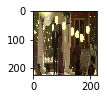

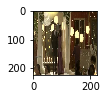

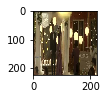

####################################   CLUSTER ###################################################################


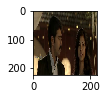

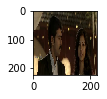

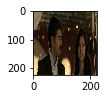

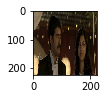

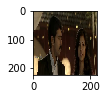

...

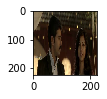

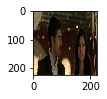

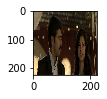

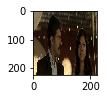

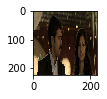

####################################   CLUSTER ###################################################################


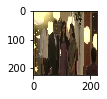

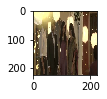

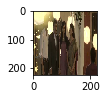

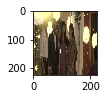

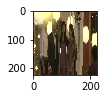

...

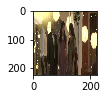

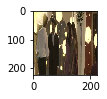

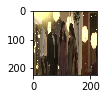

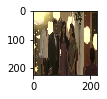

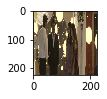

####################################   CLUSTER ###################################################################


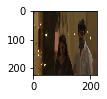

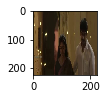

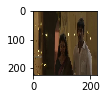

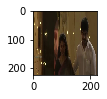

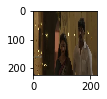

...

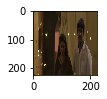

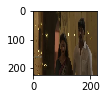

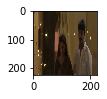

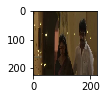

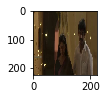

####################################   CLUSTER ###################################################################


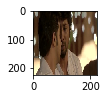

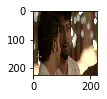

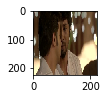

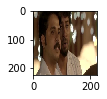

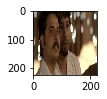

...

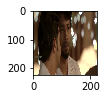

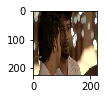

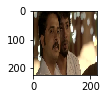

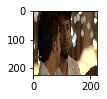

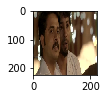

####################################   CLUSTER ###################################################################


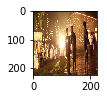

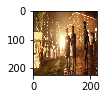

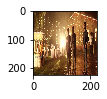

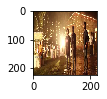

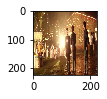

...

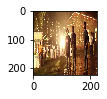

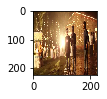

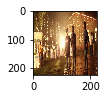

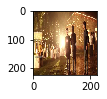

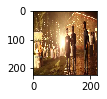

####################################   CLUSTER ###################################################################


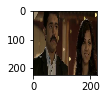

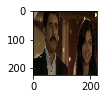

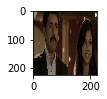

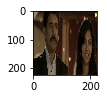

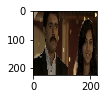

...

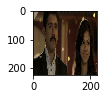

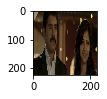

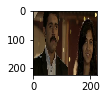

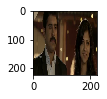

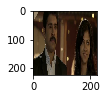

####################################   CLUSTER ###################################################################


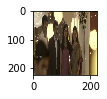

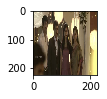

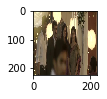

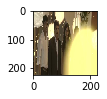

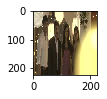

...

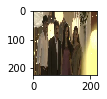

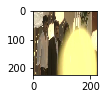

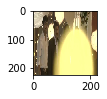

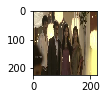

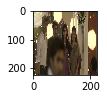

####################################   CLUSTER ###################################################################


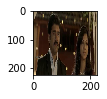

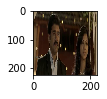

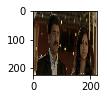

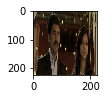

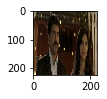

...

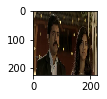

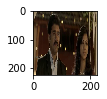

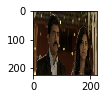

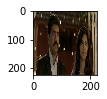

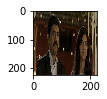

####################################   CLUSTER ###################################################################


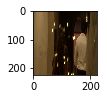

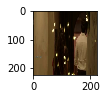

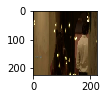

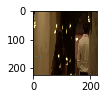

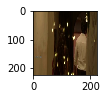

...

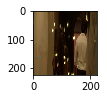

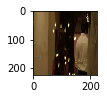

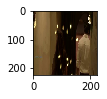

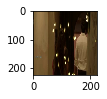

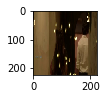

####################################   CLUSTER ###################################################################


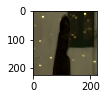

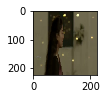

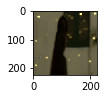

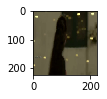

####################################   CLUSTER ###################################################################


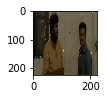

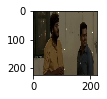

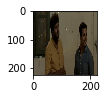

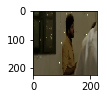

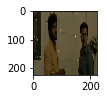

...

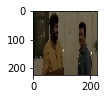

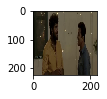

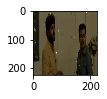

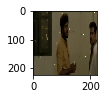

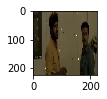

####################################   CLUSTER ###################################################################


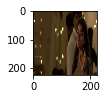

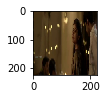

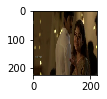

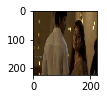

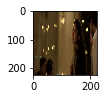

...

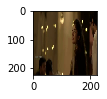

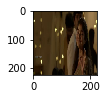

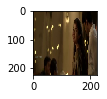

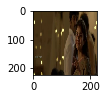

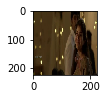

####################################   CLUSTER ###################################################################


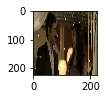

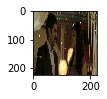

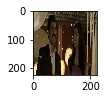

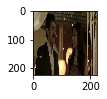

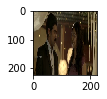

...

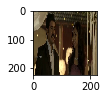

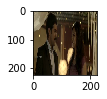

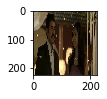

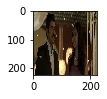

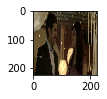

####################################   CLUSTER ###################################################################


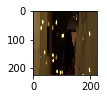

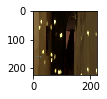

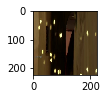

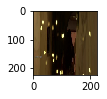

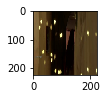

...

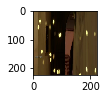

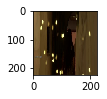

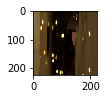

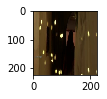

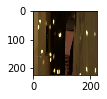

####################################   CLUSTER ###################################################################


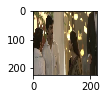

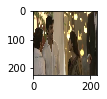

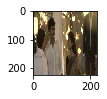

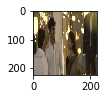

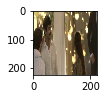

...

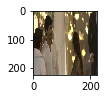

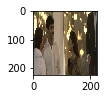

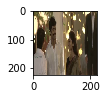

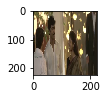

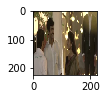

####################################   CLUSTER ###################################################################


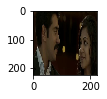

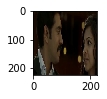

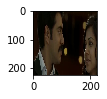

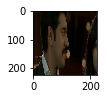

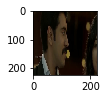

...

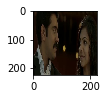

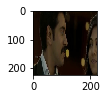

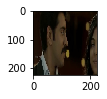

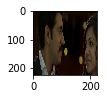

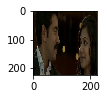

####################################   CLUSTER ###################################################################


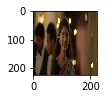

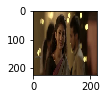

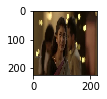

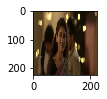

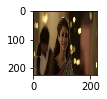

...

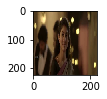

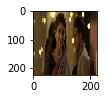

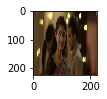

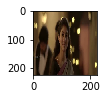

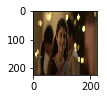

####################################   CLUSTER ###################################################################


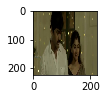

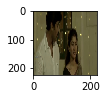

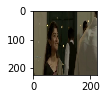

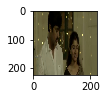

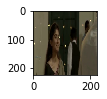

...

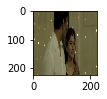

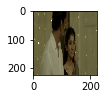

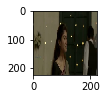

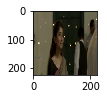

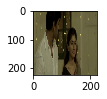

####################################   CLUSTER ###################################################################


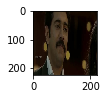

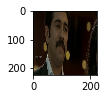

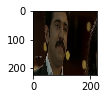

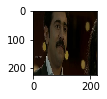

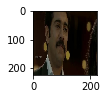

...

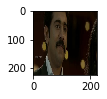

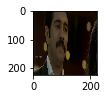

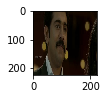

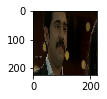

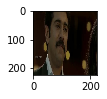

####################################   CLUSTER ###################################################################


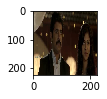

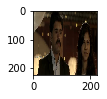

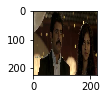

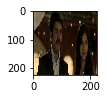

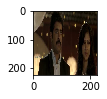

...

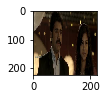

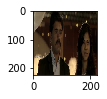

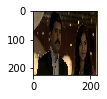

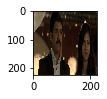

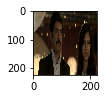

####################################   CLUSTER ###################################################################


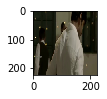

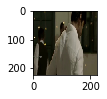

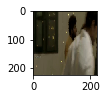

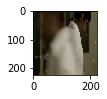

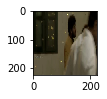

...

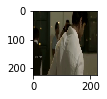

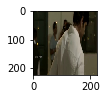

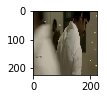

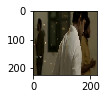

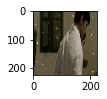

####################################   CLUSTER ###################################################################


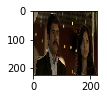

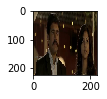

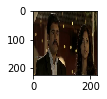

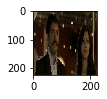

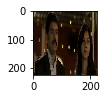

...

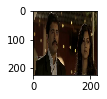

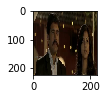

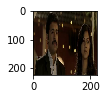

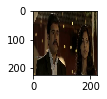

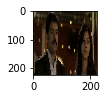

####################################   CLUSTER ###################################################################


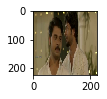

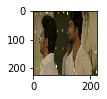

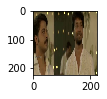

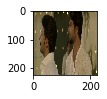

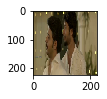

...

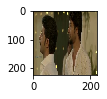

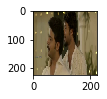

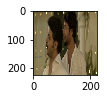

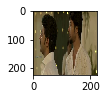

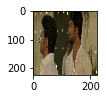

####################################   CLUSTER ###################################################################


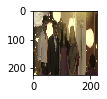

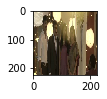

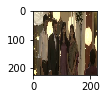

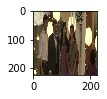

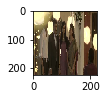

...

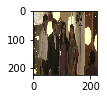

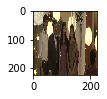

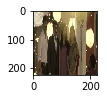

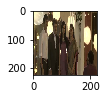

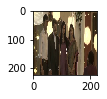

####################################   CLUSTER ###################################################################


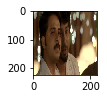

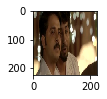

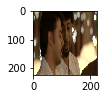

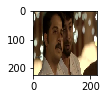

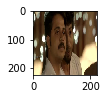

...

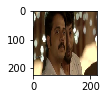

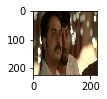

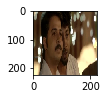

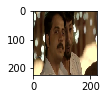

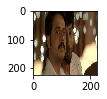

####################################   CLUSTER ###################################################################


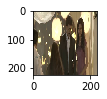

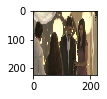

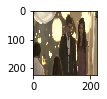

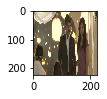

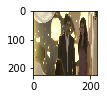

...

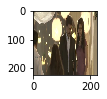

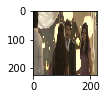

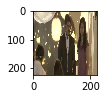

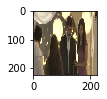

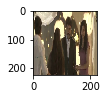

####################################   CLUSTER ###################################################################


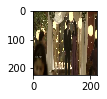

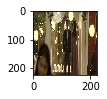

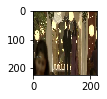

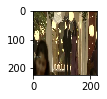

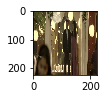

...

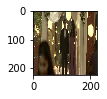

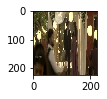

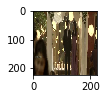

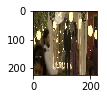

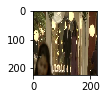

####################################   CLUSTER ###################################################################


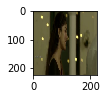

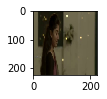

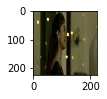

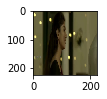

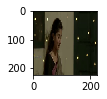

...

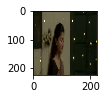

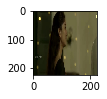

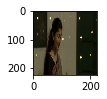

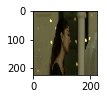

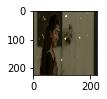

####################################   CLUSTER ###################################################################


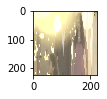

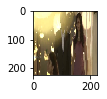

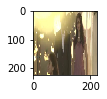

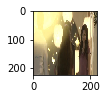

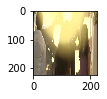

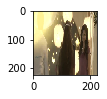

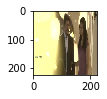

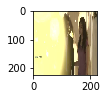

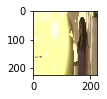

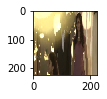

####################################   CLUSTER ###################################################################


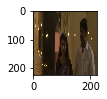

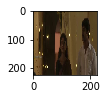

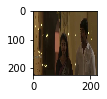

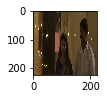

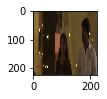

...

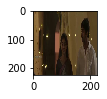

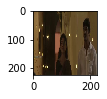

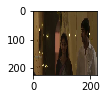

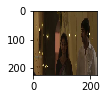

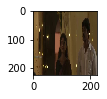

####################################   CLUSTER ###################################################################


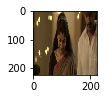

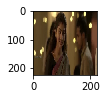

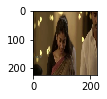

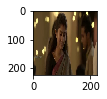

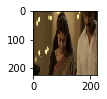

...

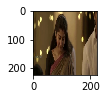

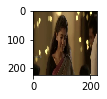

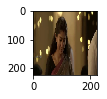

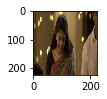

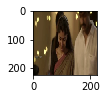

####################################   CLUSTER ###################################################################


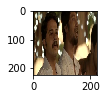

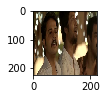

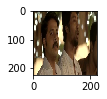

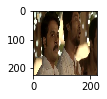

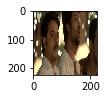

...

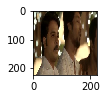

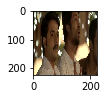

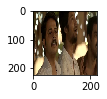

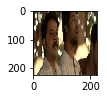

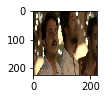

####################################   CLUSTER ###################################################################


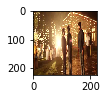

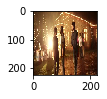

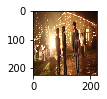

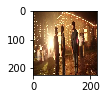

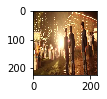

...

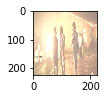

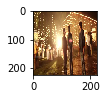

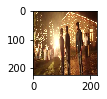

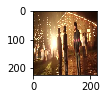

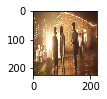

####################################   CLUSTER ###################################################################


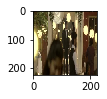

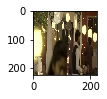

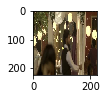

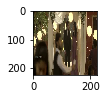

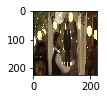

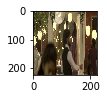

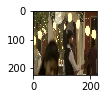

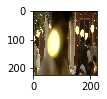

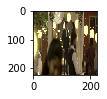

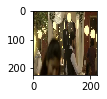

####################################   CLUSTER ###################################################################


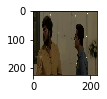

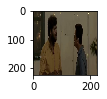

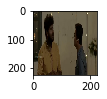

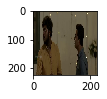

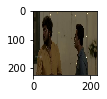

...

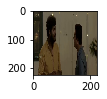

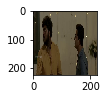

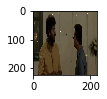

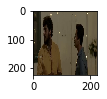

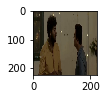

####################################   CLUSTER ###################################################################


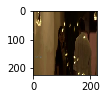

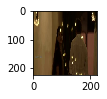

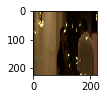

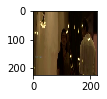

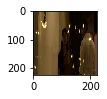

...

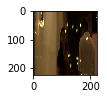

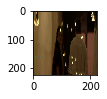

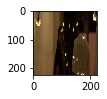

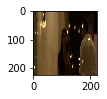

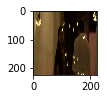

####################################   CLUSTER ###################################################################


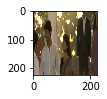

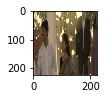

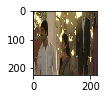

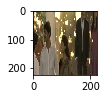

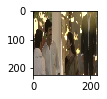

...

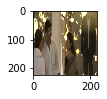

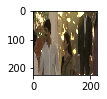

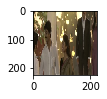

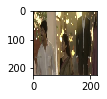

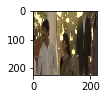

####################################   CLUSTER ###################################################################


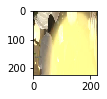

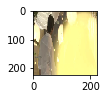

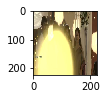

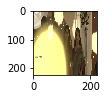

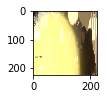

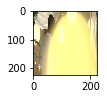

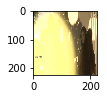

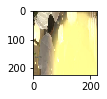

####################################   CLUSTER ###################################################################


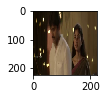

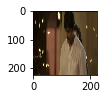

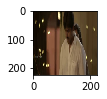

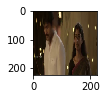

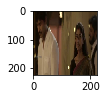

...

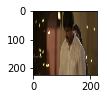

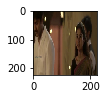

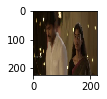

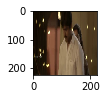

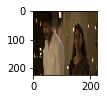

####################################   CLUSTER ###################################################################


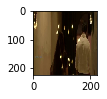

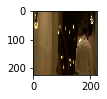

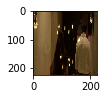

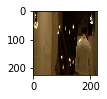

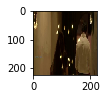

...

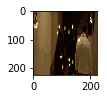

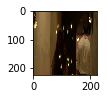

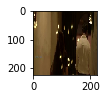

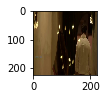

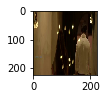

####################################   CLUSTER ###################################################################


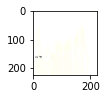

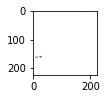

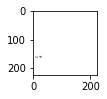

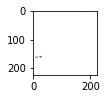

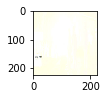

####################################   CLUSTER ###################################################################


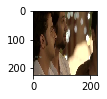

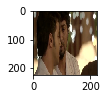

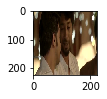

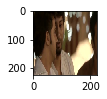

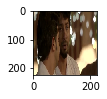

...

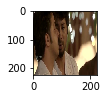

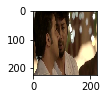

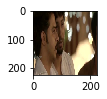

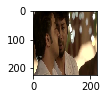

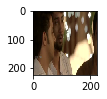

####################################   CLUSTER ###################################################################


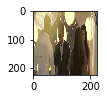

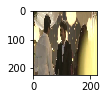

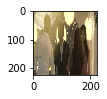

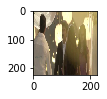

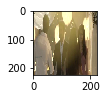

...

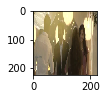

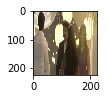

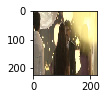

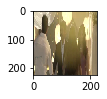

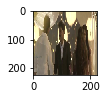

####################################   CLUSTER ###################################################################


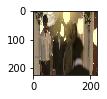

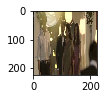

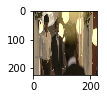

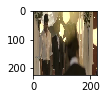

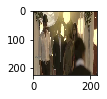

...

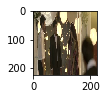

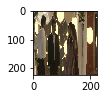

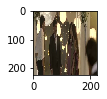

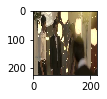

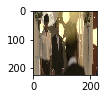

####################################   CLUSTER ###################################################################


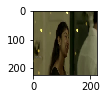

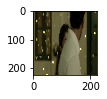

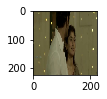

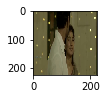

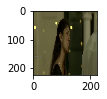

...

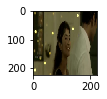

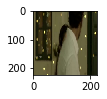

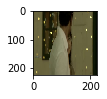

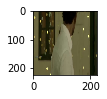

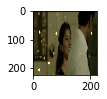

####################################   CLUSTER ###################################################################


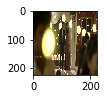

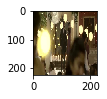

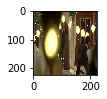

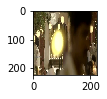

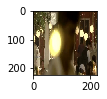

...

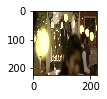

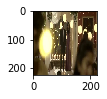

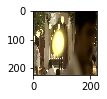

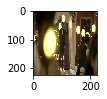

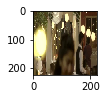

####################################   CLUSTER ###################################################################


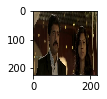

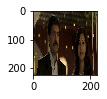

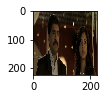

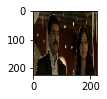

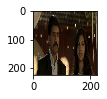

...

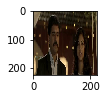

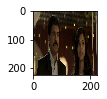

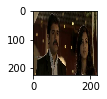

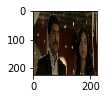

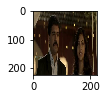

####################################   CLUSTER ###################################################################


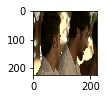

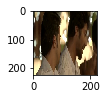

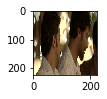

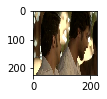

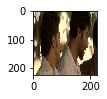

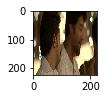

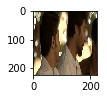

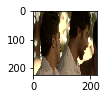

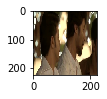

In [0]:

for clst in range(0,49):
  j=clst
  print("####################################   CLUSTER ###################################################################")
  getlab=np.where(lab==j)[0]
  img1=[]
  for i in range(len(getlab)):
    x,_=load_image(images[getlab[i]])
    img1.append(x)  


  plt.figure(1)
  for i in range(len(img1)):
  
    plt.subplot(211)
    plt.imshow(img1[i])

    plt.subplot(312)
    plt.imshow(img1[i])
    plt.show()
  

In [0]:
# import cv2

# vidcap = cv2.VideoCapture('permam.mp4')
# success,image = vidcap.read()
# count = 0
# success = True
# frame_list=[]
# while success:
#     cv2.imwrite("frame%d.jpg" % count, image)     #
#     success,image = vidcap.read()
#     frame_list.append(image)
#     print ('Read a new frame: ', success)
#     count += 1
#     print(count)
    

Read a new frame:  True
1
Read a new frame:  True
2
Read a new frame:  True
3
Read a new frame:  True
4
Read a new frame:  True
5
Read a new frame:  True
6
Read a new frame:  True
7
Read a new frame:  True
8
Read a new frame:  True
9
Read a new frame:  True
10
Read a new frame:  True
11
Read a new frame:  True
12
Read a new frame:  True
13
Read a new frame:  True
14
Read a new frame:  True
15
Read a new frame:  True
16
Read a new frame:  True
17
Read a new frame:  True
18
Read a new frame:  True
19
Read a new frame:  True
20
Read a new frame:  True
21
Read a new frame:  True
22
Read a new frame:  True
23
Read a new frame:  True
24
Read a new frame:  True
25
Read a new frame:  True
26
Read a new frame:  True
27
Read a new frame:  True
28
Read a new frame:  True
29
Read a new frame:  True
30
Read a new frame:  True
31
Read a new frame:  True
32
Read a new frame:  True
33
Read a new frame:  True
34
Read a new frame:  True
35
Read a new frame:  True
36
Read a new frame:  True
37
Read a new